In [6]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""
import tensorflow as tf
print("GPU available?", tf.test.is_gpu_available())

GPU available? False


In [82]:
%load_ext tensorboard
from tensorflow.python.client import device_lib
import glob
import pandas as pd
import subprocess
import matplotlib.pyplot as plt
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["CUDA_VISIBLE_DEVICES"] = ""
from IPython.display import display, HTML

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


i ran this command initially in my bash, not sure how to save the cmd runs will do the rest of the run calls from here on though

%%bash


python train.py \
  --data_dir=./data/sherlock \
  --save_dir=./save/baseline \
  --log_dir=./logs/baseline \
  --model=lstm \
  --num_layers=2 \
  --rnn_size=128 \
  --seq_length=50 \
  --batch_size=50 \
  --num_epochs=20 \
  --learning_rate=0.002 \
  --grad_clip=5.0

I initially began with an LSTM model because they sometimes create text that has meaningful context over a simple RNN model. I opted to choose a two stacked layer because it was what was originally suggested in the github page at https://github.com/sherjilozair/char-rnn-tensorflow . I also just chose an initial rnn_size of 128 because on the github page, they said to tweak it starting from this number if  you have a lot of input data. The Sherlock Holmes data is quite large, but this is the baseline so it'll increase from here on. An initial sequence length of 50 is long enough to capture short phrases and basic punctuation patterns yet short enough that the LSTM’s gradients won’t vanish completely. A batch_size of 50 is just optimal for my GPU utilization. I trained the model for 20 epochs (--num_epochs=20, --learning_rate=0.002, --grad_clip=5.0) to ensure convergence, it'll probably prove that I can reduce the number of epochs, or alter one of these parameters. If I see overfitting in the sample text data, it might make us also add the paramters of --input_keep_prob and --output_keep_prob as suggested in the github repo.

step=     0   tag=logits                 value=0.000000
step=     0   tag=loss                   value=0.000000
step=     0   tag=train_loss             value=4.557719
step=     1   tag=logits                 value=0.000000
step=     1   tag=loss                   value=0.000000
step=     1   tag=train_loss             value=4.511692
step=     2   tag=logits                 value=0.000000
step=     2   tag=loss                   value=0.000000
step=     2   tag=train_loss             value=4.400720
step=     3   tag=logits                 value=0.000000
step=     3   tag=loss                   value=0.000000
step=     3   tag=train_loss             value=4.071941
step=     4   tag=logits                 value=0.000000
step=     4   tag=loss                   value=0.000000
step=     4   tag=train_loss             value=3.649529
step=     5   tag=logits                 value=0.000000
step=     5   tag=loss                   value=0.000000
step=     5   tag=train_loss             value=3

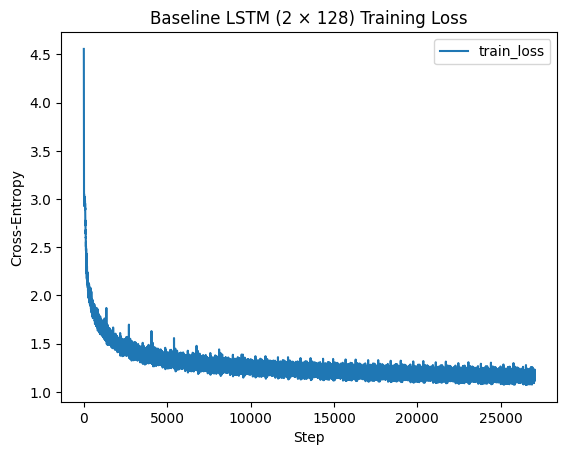

In [ ]:
logfile = glob.glob("logs/baseline/**/events.out.tfevents.*", recursive=True)[0]
for e in tf.compat.v1.train.summary_iterator(logfile):
    for v in e.summary.value:
        print(f"step={e.step:6d}   tag={v.tag:20s}   value={v.simple_value:.6f}")
steps, train_losses = [], []
for e in tf.compat.v1.train.summary_iterator(logfile):
    for v in e.summary.value:
        if v.tag == "train_loss":
            steps.append(e.step)
            train_losses.append(v.simple_value)

plt.plot(steps, train_losses, label = "train_loss")
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("Baseline LSTM (2 × 128) Training Loss")
plt.legend()
plt.show()

Yep, can definitely reduce the number of epochs, since we see that 90% of the loss drop by step 10000, so let's just halve the training time. We can also drop the learning rate and give it a small per-epoch delay.

In [ ]:
%%bash
sample1=$(python sample.py \
  --save_dir save/baseline \
  --prime "I " \
  -n 300 2>/dev/null)

echo "$sample1"
echo
char_count=$(echo -n "$sample1" | wc -c)
echo "→ Character count: $char_count"

I jconerrid brower consulted greatfore was thoughtful's
     foot. I confide-cot"-that it was mouthing. Is his. D's aband which leave to
     the four never arall right sign of them. No one's well; pet
     ball noticer."

     "If you will pick Peter Coming his chain, and we have go some freshened
  

→ Character count: 308


Unfortunately, this sampled sentence generated from the model is still largely unintelligible. The local character-level patterns makes up some words, others mainly gibberish, and it just fails to sustain coherent, sentence-level structure in these 300 characters. In addition to altering the number of epochs and learning rate, we’ll need to give the model more capacity and context by increasing the hidden-state size or number of layers, lengthening the sequence window, and adding dropout to help it learn longer‐range dependencies and produce truly coherent sentences.

In [ ]:
%%bash
python train.py \
  --data_dir ./data/sherlock \
  --save_dir save/updated_run \
  --log_dir logs/updated_run \
  --model lstm \
  --num_layers 2 \
  --rnn_size 256 \
  --seq_length 64 \
  --batch_size 50 \
  --num_epochs 10 \
  --learning_rate 0.001 \
  --decay_rate 0.98 \
  --input_keep_prob   0.8 \
  --output_keep_prob 0.8 \
  --grad_clip 5.0

loading preprocessed files
0/10560 (epoch 0), train_loss = 4.584, time/batch = 0.624
model saved to save/updated_run\model.ckpt
1/10560 (epoch 0), train_loss = 4.535, time/batch = 0.159
2/10560 (epoch 0), train_loss = 4.433, time/batch = 0.156
3/10560 (epoch 0), train_loss = 4.116, time/batch = 0.157
4/10560 (epoch 0), train_loss = 3.800, time/batch = 0.159
5/10560 (epoch 0), train_loss = 3.577, time/batch = 0.163
6/10560 (epoch 0), train_loss = 3.399, time/batch = 0.162
7/10560 (epoch 0), train_loss = 3.405, time/batch = 0.162
8/10560 (epoch 0), train_loss = 3.349, time/batch = 0.156
9/10560 (epoch 0), train_loss = 3.258, time/batch = 0.155
10/10560 (epoch 0), train_loss = 3.140, time/batch = 0.156
11/10560 (epoch 0), train_loss = 3.117, time/batch = 0.156
12/10560 (epoch 0), train_loss = 3.076, time/batch = 0.155
13/10560 (epoch 0), train_loss = 3.094, time/batch = 0.152
14/10560 (epoch 0), train_loss = 3.069, time/batch = 0.149
15/10560 (epoch 0), train_loss = 3.079, time/batch = 0.

Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where










Instructions for updating:
Use standard file APIs to delete files with this prefix.


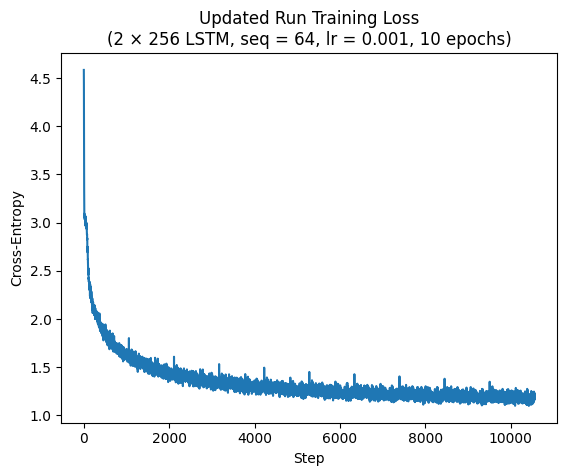

In [30]:
def load_train_loss(exp_name):
    path = glob.glob(f"logs/{exp_name}/**/events.out.tfevents.*", recursive=True)[0]
    steps, vals = [], []
    for e in tf.compat.v1.train.summary_iterator(path):
        for v in e.summary.value:
            if v.tag == "train_loss":
                steps.append(e.step)
                vals.append(v.simple_value)
    return steps, vals
steps_upd,  loss_upd  = load_train_loss("updated_run")
plt.plot(steps_upd, loss_upd)
plt.xlabel("Step")
plt.ylabel("Cross-Entropy")
plt.title("Updated Run Training Loss\n(2 × 256 LSTM, seq = 64, lr = 0.001, 10 epochs)")
plt.show()

In [ ]:
%%bash
sample2=$(python sample.py \
  --save_dir save/updated_run \
  --prime "I " \
  -n 300 2>/dev/null)
echo "$sample2"
echo
char_count=$(echo -n "$sample2" | wc -c)
echo "→ Character count: $char_count"

I                 His London,
        Ba widden long men and "JoMc. For Chelpes Haster!

     "Well, if you have haused her only falling you remember that Holmes was
     broken. What Mn. Sir My Garder whe can did you know what
     does the bedroad Walkington matters?"

     "If you can did the house

→ Character count: 309


So it seems like there was faster convergence, hitting the plateua a little faster from the baseline model, and perhaps I can still reduce the number of epochs even further. The text also feels a bit more "Victorian" in speech, but still has some invented words, that aren't entirely accurate in real speech. The context in the sentence is also not entirely there. Thus I need to add a bit more depth, more context, less training, and stronger regularization. I can increase it to 3 layers, increase the sequence length to 100, and make the input and output probability decrease to 0.6.

In [ ]:
%%bash
python train.py \
  --data_dir ./data/sherlock \
  --save_dir save/updated_run_2 \
  --log_dir logs/updated_run_2 \
  --model lstm \
  --num_layers 3 \
  --rnn_size 256 \
  --seq_length 100 \
  --batch_size 80 \
  --num_epochs 5 \
  --learning_rate 0.005 \
  --decay_rate 0.98 \
  --input_keep_prob 0.6 \
  --output_keep_prob 0.6 \
  --grad_clip 5.0 

loading preprocessed files
0/2110 (epoch 0), train_loss = 4.581, time/batch = 1.722
model saved to save/updated_run_2\model.ckpt
1/2110 (epoch 0), train_loss = 4.226, time/batch = 0.503
2/2110 (epoch 0), train_loss = 3.671, time/batch = 0.523
3/2110 (epoch 0), train_loss = 3.465, time/batch = 0.525
4/2110 (epoch 0), train_loss = 3.362, time/batch = 0.537
5/2110 (epoch 0), train_loss = 3.248, time/batch = 0.529
6/2110 (epoch 0), train_loss = 3.160, time/batch = 0.537
7/2110 (epoch 0), train_loss = 3.134, time/batch = 0.532
8/2110 (epoch 0), train_loss = 3.144, time/batch = 0.532
9/2110 (epoch 0), train_loss = 3.140, time/batch = 0.530
10/2110 (epoch 0), train_loss = 3.109, time/batch = 0.536
11/2110 (epoch 0), train_loss = 3.103, time/batch = 0.529
12/2110 (epoch 0), train_loss = 3.089, time/batch = 0.535
13/2110 (epoch 0), train_loss = 3.073, time/batch = 0.551
14/2110 (epoch 0), train_loss = 3.072, time/batch = 0.546
15/2110 (epoch 0), train_loss = 3.065, time/batch = 0.551
16/2110 (e

Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where












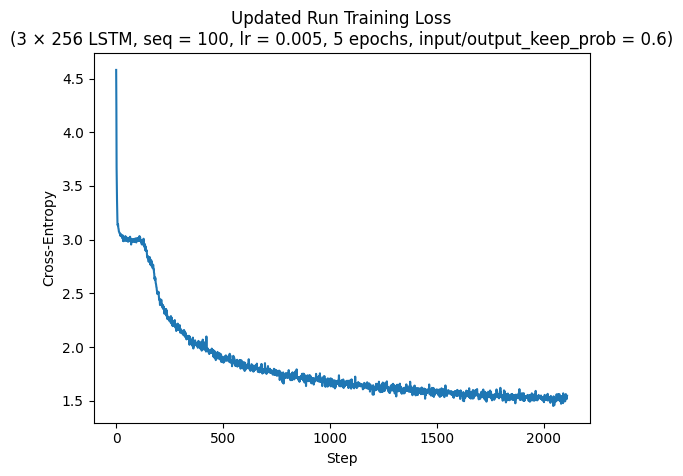

In [31]:
steps_upd_2,  loss_upd_2  = load_train_loss("updated_run_2")
plt.plot(steps_upd_2, loss_upd_2)
plt.xlabel("Step")
plt.ylabel("Cross-Entropy")
plt.title("Updated Run Training Loss\n(3 × 256 LSTM, seq = 100, lr = 0.005, 5 epochs, input/output_keep_prob = 0.6)")
plt.show()

In [22]:
%%bash
sample3=$(python sample.py \
  --save_dir save/updated_run_2 \
  --prime "I " \
  -n 300 2>/dev/null)
echo "$sample3"
echo
char_count=$(echo -n "$sample3" | wc -c)
echo "→ Character count: $char_count"

I but it had
     pood yesterly beun
     punlice of my
     injid
     men nog the pound, if it of remushieg, which did porstented as a begdeival light. For allooking out of you your scill who maje a look. Yow may to be like to calms of my looker. Why, you cae sten bott Enoses who
     Rest, he had n

→ Character count: 307


It seems that increasing the learning rate cause a memorization of strange patterns in the Sherlock text, making the generated sample text even worse than before. I suppose we revert the learning back down, trying 0.003, 0.002, and even 0.001, and increase both of the keep_probabilites back up to 0.8. Maybe we also slightly increase the num_epochs up to 8 to get the final training loss down to 1.4, so it's around 80% of the total convergence towards the final trainign loss of 1.1 from the baseline model. Even decreasing the decay_rate back to default of 0.97 might help improve the text sample. Furthermore, the structure of the sample text was more coherent when sequence_length was 64. 

In [ ]:
%%bash
base="\
  --data_dir ./data/sherlock \
  --model lstm \
  --num_layers 3 \
  --rnn_size 256 \
  --seq_length 64 \
  --batch_size 50 \
  --num_epochs 8 \
  --decay_rate 0.97 \
  --input_keep_prob 0.8 \
  --output_keep_prob 0.8 \
  --grad_clip 5.0"

for lr in 0.001 0.002 0.003; do
  file_name="lr_${lr//./}"
  save_directory="save/${file_name}"
  log_directory="logs/${file_name}"
  mkdir -p "$save_directory" "$log_directory"
  echo "=== Running learning_rate=$lr ==="
  python train.py \
    $base \
    --save_dir    "$save_directory" \
    --log_dir     "$log_directory" \
    --learning_rate "$lr"
done

=== Running learning_rate=0.001 ===
loading preprocessed files
0/8448 (epoch 0), train_loss = 4.550, time/batch = 0.887
model saved to save/lr_0001\model.ckpt
1/8448 (epoch 0), train_loss = 4.489, time/batch = 0.226
2/8448 (epoch 0), train_loss = 4.277, time/batch = 0.228
3/8448 (epoch 0), train_loss = 3.705, time/batch = 0.230
4/8448 (epoch 0), train_loss = 3.699, time/batch = 0.227
5/8448 (epoch 0), train_loss = 3.351, time/batch = 0.226
6/8448 (epoch 0), train_loss = 3.283, time/batch = 0.228
7/8448 (epoch 0), train_loss = 3.313, time/batch = 0.228
8/8448 (epoch 0), train_loss = 3.259, time/batch = 0.226
9/8448 (epoch 0), train_loss = 3.175, time/batch = 0.227
10/8448 (epoch 0), train_loss = 3.088, time/batch = 0.226
11/8448 (epoch 0), train_loss = 3.090, time/batch = 0.221
12/8448 (epoch 0), train_loss = 3.048, time/batch = 0.225
13/8448 (epoch 0), train_loss = 3.108, time/batch = 0.228
14/8448 (epoch 0), train_loss = 3.084, time/batch = 0.218
15/8448 (epoch 0), train_loss = 3.087,

Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where










Instructions for updating:
Use standard file APIs to delete files with this prefix.
Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced

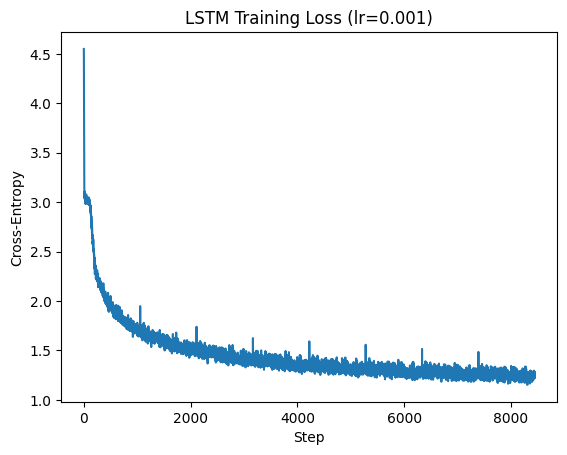

In [32]:
steps_lr_0001, loss_lr_0001 = load_train_loss("lr_0001")
plt.plot(steps_lr_0001, loss_lr_0001)
plt.xlabel("Step")
plt.ylabel("Cross-Entropy")
plt.title("LSTM Training Loss (lr=0.001)")
plt.show()

In [72]:
%%bash
sample4=$(python sample.py \
  --save_dir save/lr_0001 \
  --prime "I " \
  -n 300 2>/dev/null)
echo "$sample4"
echo
char_count=$(echo -n "$sample4" | wc -c)
echo "→ Character count: $char_count"

I    Brother Morsing maids other kay which had come down
     own excelotion. Now the inclusion is now from Light and deep. He was not
     only two cause. She did all suggestion of deal--enough, that Gergon's
     housekeeper's house, to the normow is not get to be feet out of regard
     to remarks 

→ Character count: 306


This honestly looks a lot better from the last attempt, with good sentence structure, capturing what it seems like a dialogue? Though there doesn't seem to be proper English still.

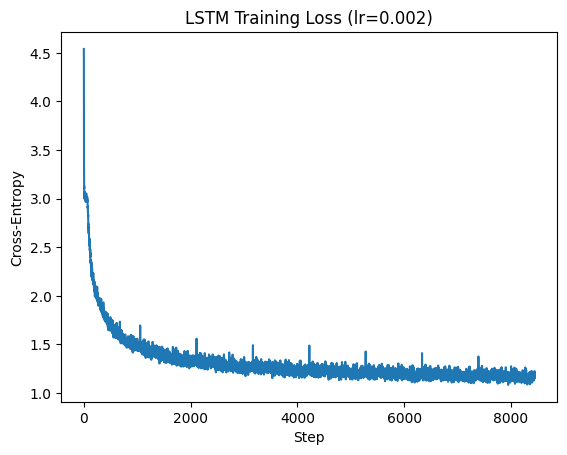

In [33]:
steps_lr_0002, loss_lr_0002 = load_train_loss("lr_0002")
plt.plot(steps_lr_0002, loss_lr_0002)
plt.xlabel("Step")
plt.ylabel("Cross-Entropy")
plt.title("LSTM Training Loss (lr=0.002)")
plt.show()

In [24]:
%%bash
sample5=$(python sample.py \
  --save_dir save/lr_0002 \
  --prime "I " \
  -n 300 2>/dev/null)
echo "$sample5"
echo
char_count=$(echo -n "$sample5" | wc -c)
echo "→ Character count: $char_count"

I                                                                                                                                                              H HARS COAh ADVENTURE THINX

     "McMurdo, I think, safe his rits or fresh possible tratk this mystery! My
     vouces were not of an intricit

→ Character count: 305


Gibberish

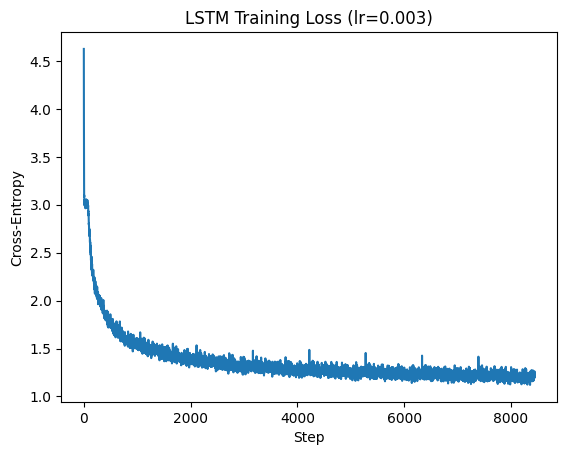

In [34]:
steps_lr_0003, loss_lr_0003 = load_train_loss("lr_0003")
plt.plot(steps_lr_0003, loss_lr_0003)
plt.xlabel("Step")
plt.ylabel("Cross-Entropy")
plt.title("LSTM Training Loss (lr=0.003)")
plt.show()

In [25]:
%%bash
sample6=$(python sample.py \
  --save_dir save/lr_0003 \
  --prime "I " \
  -n 300 2>/dev/null)
echo "$sample6"
echo
char_count=$(echo -n "$sample6" | wc -c)
echo "→ Character count: $char_count"

I mister into some
     prited rilling very half gasp in this file. Stangerson of them
     sea that the extremely heart could not faval wooden England.

     "Exclaning your ruffing for faxciol."

     Holmes wondered his depurory. He is a power, the fierce and a red little
     horse of his eyes. On

→ Character count: 309


In [4]:
%%bash 
set -e
declare -A params=(
  [baseline]="--model nas --num_layers 2 --rnn_size 128 --seq_length 50 --batch_size 50 --num_epochs 20 --learning_rate 0.002 --grad_clip 5.0"
  [updated_run]="--model nas --num_layers 2 --rnn_size 256 --seq_length 64 --batch_size 50 --num_epochs 10 --learning_rate 0.001 --decay_rate 0.98 --input_keep_prob 0.8 --output_keep_prob 0.8 --grad_clip 5.0"
  [updated_run_2]="--model nas --num_layers 3 --rnn_size 256 --seq_length 100 --batch_size 80 --num_epochs 5 --learning_rate 0.005 --decay_rate 0.98 --input_keep_prob 0.6 --output_keep_prob 0.6 --grad_clip 5.0"
)
models=(baseline updated_run updated_run_2)
for name in "${models[@]}"; do
  save_directory="save/${name}_nas"
  log_directory="logs/${name}_nas"
  mkdir -p "$save_directory" "$log_directory"
  echo "=== Training NAS (${name}) ==="
  python train.py --data_dir ./data/sherlock ${params[$name]} \
    --save_dir "$save_directory" --log_dir "$log_directory"
done
# last 3 models but for standard rnn model
base_mdl="\
  --data_dir ./data/sherlock \
  --model nas \
  --num_layers 3 \
  --rnn_size 256 \
  --seq_length 64 \
  --batch_size 50 \
  --num_epochs 8 \
  --decay_rate 0.97 \
  --input_keep_prob 0.8 \
  --output_keep_prob 0.8 \
  --grad_clip 5.0"

for lr in 0.001 0.002 0.003; do
  file_name="lr_${lr//./}_nas"
  save_directory="save/${file_name}"
  log_directory="logs/${file_name}"
  mkdir -p "$save_directory" "$log_directory"
  echo "=== NAS final sweep: learning_rate=$lr ==="
  python train.py \
    --data_dir ./data/sherlock $base_mdl \
    --learning_rate $lr \
    --save_dir "$save_directory" \
    --log_dir "$log_directory"
done

=== Training NAS (baseline) ===
loading preprocessed files
0/27040 (epoch 0), train_loss = 4.609, time/batch = 0.205
model saved to save/baseline_nas\model.ckpt
1/27040 (epoch 0), train_loss = 4.610, time/batch = 0.060
2/27040 (epoch 0), train_loss = 4.605, time/batch = 0.059
3/27040 (epoch 0), train_loss = 4.599, time/batch = 0.061
4/27040 (epoch 0), train_loss = 4.597, time/batch = 0.061
5/27040 (epoch 0), train_loss = 4.591, time/batch = 0.063
6/27040 (epoch 0), train_loss = 4.587, time/batch = 0.062
7/27040 (epoch 0), train_loss = 4.577, time/batch = 0.061
8/27040 (epoch 0), train_loss = 4.570, time/batch = 0.061
9/27040 (epoch 0), train_loss = 4.554, time/batch = 0.062
10/27040 (epoch 0), train_loss = 4.538, time/batch = 0.060
11/27040 (epoch 0), train_loss = 4.510, time/batch = 0.062
12/27040 (epoch 0), train_loss = 4.469, time/batch = 0.062
13/27040 (epoch 0), train_loss = 4.383, time/batch = 0.062
14/27040 (epoch 0), train_loss = 4.232, time/batch = 0.057
15/27040 (epoch 0), tr

Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Please use `layer.add_weight` method instead.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where










Instructions for updating:
Use standard file APIs to delete files with this prefix.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Please use `layer.add_weight` method instead.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where










Instructions for updating:
Use standard file APIs to

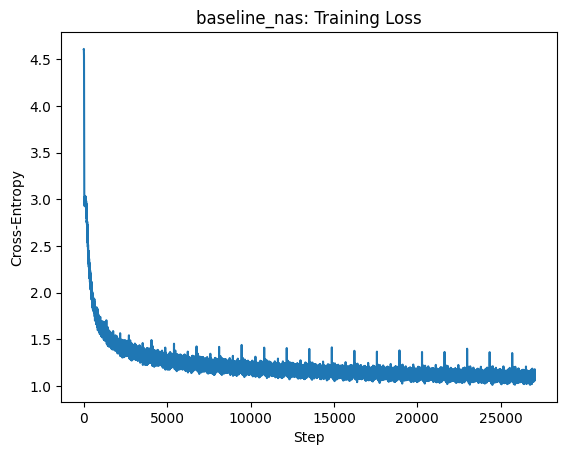

In [35]:
steps_baseline_nas, loss_baseline_nas = load_train_loss("baseline_nas")
plt.plot(steps_baseline_nas, loss_baseline_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("baseline_nas: Training Loss")
plt.show()

In [36]:
%%bash
sample_baseline_nas=$(python sample.py --save_dir save/baseline_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_baseline_nas"
echo
echo "→ Character count: $(echo -n "$sample_baseline_nas" | wc -c)"

I on
     at my arms, as you heard what has been like some new creature to
     they, us. Iclelling at the evening, but some night without absent chrinking affats
     ang inhabitation which the arrives what has been breathing
     her watch of case with interesting help by being bad disgrace impatien

→ Character count: 306


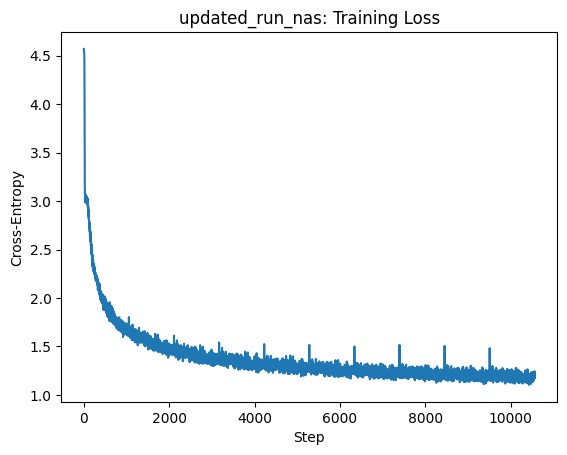

In [37]:
steps_updated_run_nas, loss_updated_run_nas = load_train_loss("updated_run_nas")
plt.plot(steps_updated_run_nas, loss_updated_run_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("updated_run_nas: Training Loss")
plt.show()

In [38]:
%%bash
sample_updated_run_nas=$(python sample.py --save_dir save/updated_run_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_updated_run_nas"
echo
echo "→ Character count: $(echo -n "$sample_updated_run_nas" | wc -c)"

I (Roys of,
     else doing himself. In procity is so as if you were there?"

     "Your pothomouther?"

     "Well, I have heard," said Johns, who asked Mr. Joundlest wable, when we heard
     my crosser, and there is no a depotishment. He was she was clearly were
     upon the lowerness in cab-times

→ Character count: 309


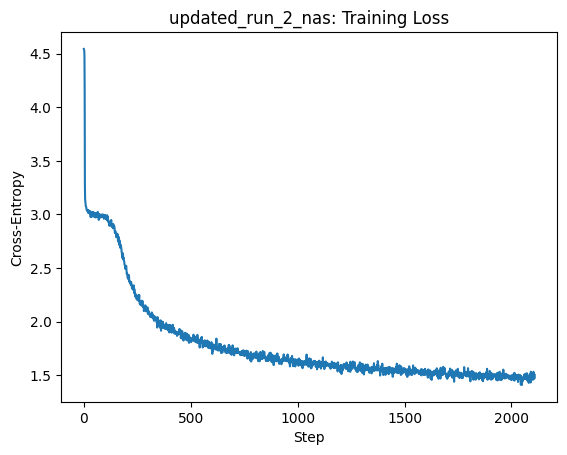

In [39]:
steps_updated_run_2_nas, loss_updated_run_2_nas = load_train_loss("updated_run_2_nas")
plt.plot(steps_updated_run_2_nas, loss_updated_run_2_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("updated_run_2_nas: Training Loss")
plt.show()

In [40]:
%%bash
sample_updated_run_2_nas=$(python sample.py --save_dir save/updated_run_2_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_updated_run_2_nas"
echo
echo "→ Character count: $(echo -n "$sample_updated_run_2_nas" | wc -c)"

I in them by two when I opened him walked to considerion of one hard and the care as with the mantelforss. So he recempopious
     missed no time had been diy seems, of continal brown found. There were supprised upon his opens Them. I'le
     master know.

     "He was retomnanked its a chull while my

→ Character count: 306


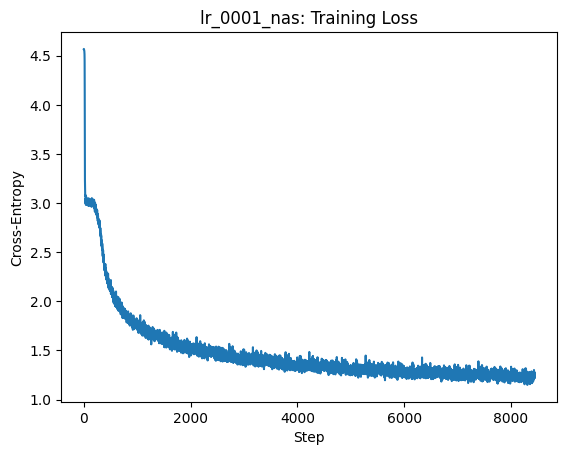

In [41]:
steps_lr_0001_nas, loss_lr_0001_nas = load_train_loss("lr_0001_nas")
plt.plot(steps_lr_0001_nas, loss_lr_0001_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("lr_0001_nas: Training Loss")
plt.show()

In [42]:
%%bash
sample_lr_0001_nas=$(python sample.py --save_dir save/lr_0001_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_lr_0001_nas"
echo
echo "→ Character count: $(echo -n "$sample_lr_0001_nas" | wc -c)"

I a view furiusion
     both a damp from the Culiadry. I knew, Come
     left ditteen. Why, I'll would us that the saw was feet along the country,
     six his guilty that described had remember to come out. But you
     trac? Pontineral Stangerson wasn't late such which has the compicution of six, a 

→ Character count: 306


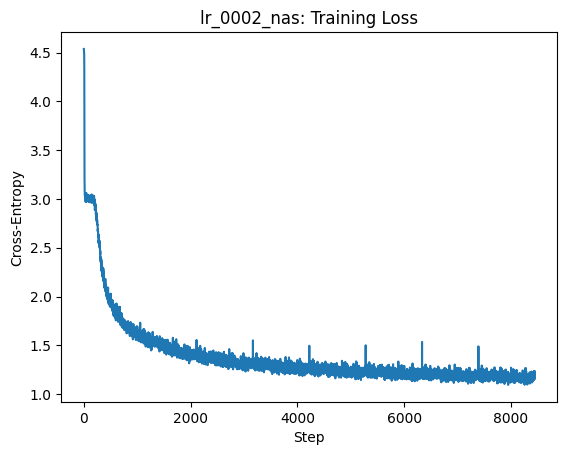

In [43]:
steps_lr_0002_nas, loss_lr_0002_nas = load_train_loss("lr_0002_nas")
plt.plot(steps_lr_0002_nas, loss_lr_0002_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("lr_0002_nas: Training Loss")
plt.show()

In [44]:
%%bash
sample_lr_0002_nas=$(python sample.py --save_dir save/lr_0002_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_lr_0002_nas"
echo
echo "→ Character count: $(echo -n "$sample_lr_0002_nas" | wc -c)"

I (500.
     There is some kitchen, and a ciparity to be placed his hand at a
     far as the plans to 23r these front of thus always the house to
     ruther me to tuen rails in the office beside of the deduction of
     their effoctable people of sitting impression earth nogety, and with all
     St

→ Character count: 307


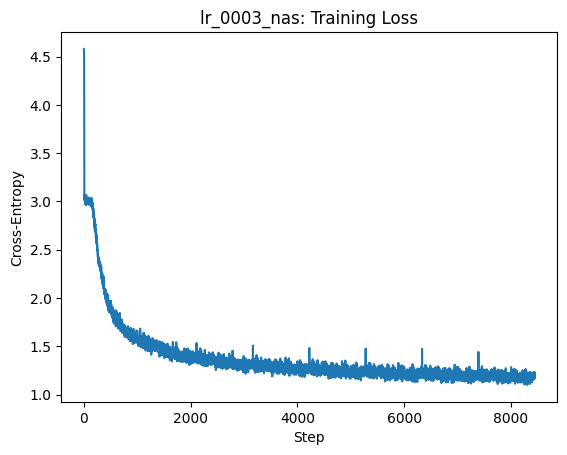

In [45]:
steps_lr_0003_nas, loss_lr_0003_nas = load_train_loss("lr_0003_nas")
plt.plot(steps_lr_0003_nas, loss_lr_0003_nas)
plt.xlabel("Step")
plt.ylabel("Cross‐Entropy")
plt.title("lr_0003_nas: Training Loss")
plt.show()

In [46]:
%%bash
sample_lr_0003_nas=$(python sample.py --save_dir save/lr_0003_nas --prime "I " -n 300 2>/dev/null)
echo "$sample_lr_0003_nas"
echo
echo "→ Character count: $(echo -n "$sample_lr_0003_nas" | wc -c)"

I in
     the house upon his explanation of the smept of it--a specials. I
     were circulstance, therefore, for hit then got by the baken man natural.
     In me back case to see a woman at Nothing against to Fimily smoly
     of the lodgers of it, quickly lain and unbut our somewhat watching
     h

→ Character count: 307


In [ ]:
values = [{"test" : "baseline_lstm", "final_loss" : train_losses[-1]},
          {"test" : "updated_run_lstm", "final_loss" : loss_upd[-1]},
          {"test" : "updated_run_2_lstm", "final_loss" : loss_upd_2[-1]},
          {"test" : "lr_0001_lstm", "final_loss" : loss_lr_0001[-1]},
          {"test" : "lr_0002_lstm", "final_loss" : loss_lr_0002[-1]},
          {"test" : "lr_0003_lstm", "final_loss" : loss_lr_0003[-1]},
          {"test" : "baseline_nas", "final_loss" : loss_baseline_nas[-1]},
          {"test" : "updated_run_nas", "final_loss" : loss_updated_run_nas[-1]},
          {"test" : "updated_run_2_nas", "final_loss" : loss_updated_run_2_nas[-1]},
          {"test" : "lr_0001_nas", "final_loss" : loss_lr_0001_nas[-1]},
          {"test" : "lr_0002_nas", "final_loss" : loss_lr_0002_nas[-1]},
          {"test" : "lr_0003_nas", "final_loss" : loss_lr_0003_nas[-1]},]
df = pd.DataFrame(values)
df[['variant', 'model']] = df['test'].str.rsplit('_', 1, expand = True)
df = df.pivot(index = 'variant', columns = 'model', values = 'final_loss').reset_index()
df = df[['variant','lstm','nas']]
df.index = range(1, len(df) + 1)
df

model,variant,lstm,nas
1,baseline,1.155074,1.099551
2,lr_0001,1.258781,1.231115
3,lr_0002,1.174434,1.164366
4,lr_0003,1.218899,1.181866
5,updated_run,1.188411,1.188163
6,updated_run_2,1.546502,1.502885


In [88]:
file_names = ["baseline","updated_run","updated_run_2","lr_0001","lr_0002","lr_0003",]
rows = []
for file in file_names:
    lstm_dir = f"save/{file}"
    lstm_out = subprocess.check_output(["python", "sample.py","--save_dir", lstm_dir,"--prime", "The ", "-n", "300"], stderr=subprocess.DEVNULL).decode().strip()
    nas_dir = f"save/{file}_nas"
    nas_out = subprocess.check_output(["python", "sample.py","--save_dir", nas_dir,"--prime", "The ","-n", "300"], stderr=subprocess.DEVNULL).decode().strip()
    rows.append({"variant": file,"lstm_sample": lstm_out,"nas_sample": nas_out,})
df = pd.DataFrame(rows, columns = ["variant", "lstm_sample", "nas_sample"])
df.index = range(1, len(df) + 1)
df.index.name = "model"
df['lstm_sample'] = df['lstm_sample'].str.replace('\r\n', '\\n', regex=False)
df['nas_sample']  = df['nas_sample'].str.replace('\r\n', '\\n', regex=False)
def pretty_print(df):
    return display(HTML(df.to_html().replace("\\n","<br>")))
pretty_print(df)
html_table_text = df.to_html()
with open('output.html', 'w') as f:
    f.write(html_table_text)

,variant,lstm_sample,nas_sample
model,,,
1,baseline,"The veen. Holmes contained of it. He was writtle and zubbing of conviction. In a list and secrece there unitiving formidfage, and smoking what paught Croughed Drebber or two keep, surmidozing of your companion, the Evilitation's more eyes. At this ways, Mr. Holmes, Mr. Mch, she anyth","The London Farm. I had already a seale, that concerned back in whether they actually doubt,"" he contembers as our by a light in whisper into the factly into the Blessington heath because. So had put Mrs. Ford as he was so dirband. Von Cluesess Brohad garse nose and enough to fi"
2,updated_run,"The Douglass but My. She 8832, E sand--a secretary , The King Barker S The Direcven Frenmingh from Cett, he toog the Ferrier Mycreft Mr. Holmes stood at the horse which he had drompored down to the rock which cheekred my","The but when was a note over the boards, and there were about my own little four."" The way, interview he knew and bad possess very assested ill-byouss benster to the window--in a gripping windows all with the bed man."" ""You're respective also who have done it at a cry that I d"
3,updated_run_2,"The could pind a Earry and with the gads was down, respect. Let me, with a ansent, while this gortes, when the clalked to used of his fortoty. The hapmened. I oul be his lad were thought'l. I have about the man? Cound her dolance masceon of his chabune spilllecs upon your Expect, the't marred no he","The wime, they have gone in every others?"" He appearing through, if he beated back,, Ruth must day as we see louf the for from keverates the corner reds fall, and quied menal of reading which juch over, not imprecestly street or Fertor. ""His cackon, 6ncely,"" said I's with every latio"
4,lr_0001,"The in a trough of many examination which has had a fire. But that in how the ungent may can all what you should think, and I have the very nume which squite this crime which lay he in this sat it, I could had the headel why they behand. And I would not gave the more than names of Ca","The all table to me that he had an stair. The fator's way upon the which is hand to Marreval, and it want, after all we heard a forehow how thought there can be to ago minutes, but she found my fine which had heard the pire of glance way up. I should elder slip again. The Macon's cou"
5,lr_0002,"The Nillet fact, in a nervous gape; but seven woman was a free, beside my acqious tone was no way from some mean as I should produce of the evening o'clock! So as it I have often made our night of her, however, and that he has played the development of evening upon this mamble--""","The The Torrible. But Aversion walked back the bedroom. On the back in a train of the station came up. They may not have got to his hand brown floor. He was shaken them. How it was me."" ""Perhaps you part that good had by the city at King Rucaptor. It do? It wasked with your int"
6,lr_0003,"The fathers upon the pretty light here which is expected in a purely. I should fave us for a meanings, in his side, with a men which had been befarm my rapidly valuable. The Islander back, however, as I may go a crade of our own."" ""I am accomplete our roge?"" ""A reag","The with the very example,"" said Holmes in usting my own lips defined. ""Well, so God between me down something,"" he cried. ""As I am seeqied to look him."" ""It was all before a below it may happen the curlence in my bent. ""You can come from one of the right, for the each of the"


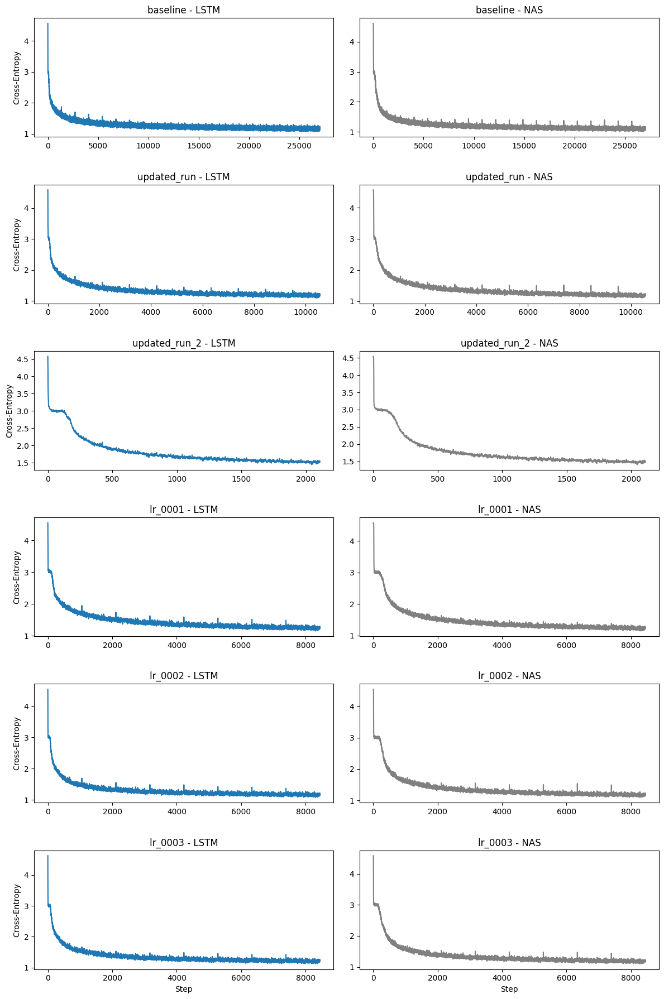

In [86]:
loss_data = {"baseline" : (steps, train_losses, steps_baseline_nas, loss_baseline_nas),
             "lr_0001": (steps_lr_0001, loss_lr_0001, steps_lr_0001_nas, loss_lr_0001_nas),
             "lr_0002": (steps_lr_0002, loss_lr_0002, steps_lr_0002_nas, loss_lr_0002_nas),
             "lr_0003": (steps_lr_0003, loss_lr_0003, steps_lr_0003_nas, loss_lr_0003_nas),
             "updated_run": (steps_upd, loss_upd, steps_updated_run_nas, loss_updated_run_nas),
             "updated_run_2": (steps_upd_2, loss_upd_2, steps_updated_run_2_nas, loss_updated_run_2_nas),}

fig, axes = plt.subplots(nrows = 6, ncols = 2, figsize = (12, 18), sharex = False, sharey = False)
for i, file in enumerate(file_names):
    s_lstm, l_lstm, s_nas, l_nas = loss_data[file]
    ax_l = axes[i, 0]
    ax_l.plot(s_lstm, l_lstm)
    ax_l.set_title(f"{file} - LSTM")
    ax_l.set_ylabel("Cross-Entropy")
    if i == 5:
        ax_l.set_xlabel("Step")
    ax_r = axes[i, 1]
    ax_r.plot(s_nas, l_nas, color = 'grey')
    ax_r.set_title(f"{file} - NAS")
    if i == 5:
        ax_r.set_xlabel("Step")
plt.tight_layout()
plt.subplots_adjust(hspace = 0.4)
plt.show()

<table border="1" class="dataframe">
  <caption>Sample Text Comparison</caption>
  <thead>
    <tr style="text-align: right;">
      <th>model</th>
      <th>variant</th>
      <th>lstm_sample</th>
      <th>nas_sample</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>baseline</td>
      <td>The when a consults, follows. <br>
      <br>
          "Did they trouble--more to you to give a quickle. His rust the <br> part of "I should do your world: 'He'll not? I will reach of <br>
          that it is reach coloured down to this eye to my father incush <br>
          which I have had taken--Charpens to long-beaous confess <br>
          of hi</td>
      <td> The was the <br>
     deduction to have none. That is that I had have hold rather than I cut to <br>
     read that. <br> <br>
     "I belp up me conceals appear of poor opportunity. She become larger man, we intrusibly <br>
     were one should produced himself, "leaving the facts." <br> <br>
     "I have didn't you were stood behind
    </td>
    </tr>
    <tr>
      <td>2</td>
      <td>updated_run</td>
      <td>The Dure, and lyon <br>
     was no word dropped upon; The person had very brink to a past. <br> <br>
     It was a friend it has my moulder appeared to know in cause, and the langers <br> 
     definitely with home of its visitor. I had professed notice, <br>
     I should get open upon the turn. As the dent of him, has some t</td>
      <td>The we shall <br>
     call the floor which came out, and that's carriage. And so you use it <br>
     with a rasp, between the bourdering garden. Lestrade?" <br> <br>
     "He has too veaying my throat of his knee in a table, however, I have <br>
     looked intending to you to the else aloud some of my life. It is in the</td>
    </tr>
    <tr>
      <td>3</td>
      <td>updated_run_2</td>
      <td>The had gever matter of Minst mrown his pict-repare-to dad dright Caich <br>
     cary <br> 
     very few thiths of up to what our trifial." <br> <br>
      Before is it to have seen by <br> 
     none it, but had work." <br> <br>
     "And to he give, this horant dacket of the way." I conclise ot an window, <br>
     the lad. <br> <br>
     "How!"</td>
      <td>The Hals. That is now protess, there was not any <br>
     words. When I am seen then we shall feet me further. "It was pure him by from Deal his tapian women <br>
     mousing off all guess miss become." <br> <br>
     "I must will both malast. We know the rooms was recy?" <br> <br>
     "Well, as So, what dishoised in the looks <br> </td>
    </tr>
    <tr>
      <td>4</td>
      <td>lr_0001</td>
      <td>The thing <br>
     he was Daken Street. I dure made a case from him., a black and a back <br>
     Room on the Lair, the hill to gray--I saw no carefully our lady appeans <br>
     make? We will, he will pite with the letter. Let kist Last then, heaven's <br>
     prisent, and the ampering gore-bay widel in the light upon</td>
      <td>The buldy. It is the <br>
     unfortunate his infidence. It was more never <br>
     after Berdy, it are, the two pluttering than who paused all to <br>
     not in sequent wife when I get him to deep in my trouble. He was spoke <br>
     fits it. Certainly; but was the man with in suiting satisficate months. <br> <br>
     "There</td>
    </tr>
    <tr>
      <td>5</td>
      <td>lr_0002</td>
      <td>The Stable. She <br>
     could go out in Cardias.  I've glanced to see West's eyes as meet, you'll <br>
     not pursuit them by seeing you a satisfactive demente of <br>
     none and wanted cause in a hurard, and he should person along the <br>
     'emanly.  These as every oldime still chamber had needed to me find my</td>
      <td>The again <br>
     cizarys of the one were began to a morning after a street evident <br>
     as pointed him on. <br>
     This gun of bright among it as to a biolent outing lantern of <br>
     the step-parain, which over for us for Ga, and the omized of the <br>
     deed by good-noted in his face which is interviewing rou</td>
    </tr>
    <tr>
      <td>6</td>
      <td>lr_0003</td>
      <td>The young assuther <br>
     at the son's murderer. Thank go informated my task's bottom," said <br>
     the huge, geting the other victim, now, but does ever! I <br>
     could expect. Of course, with the morning, only opening her <br>
     all stair of the strange man whose rivent ended by the house of light. The coolle</td>
      <td>The may <br>
     tel not kitchen. It is courted, but from Holmes," said he, criminals, and <br>
     a place and aslarental, clear that he turned and secured, which <br>
     seemed out of the natural very line. <br> <br>
     "And I have have to have had our dear?" <br> <br>
     Why drew him go hards at London, or his mind which wal</td>
    </tr>
  </tbody>
</table>